In [4]:
using DataFrames, GraphPlot, Impute, Plots, Colors, Distributions

dir = "../Mariana-Paquete/Mariana-Basefunc/"

include(dir*"funciones_de_red.jl")
include(dir*"objetos.jl")
include(dir*"dinamica_conductores.jl")
include(dir*"animaciones.jl")

plot_digraph (generic function with 1 method)

In [30]:
"""
    sig_ts(tiempo_universal, red, autos)
Calculates in how much time (with respect to `tiempo universal`) is the next departure for a car in 
the `autos` array, in the network `red`, returns that next time step and which car is the one to depart.

A departure only occurs if there is space in the street the driver wants to go. If no car can depart (or all of
them are alreay on route) the function returns infinite as next time step and `nothing` as the next car to depart.
"""
function sig_ts(tiempo_universal::Float64, Red::network, Autos::Array{auto,1})
    # Construimos el arreglo de los autos que no han salido y los ordenamos según tiempo de salida
    Estacionados = [auto for auto in Autos if !(auto.is_out)]
    p=sortperm([auto.ts for auto in Estacionados])
    Estacionados = Estacionados[p]
    for i in 1:length(Estacionados)
            u = Estacionados[i].o
            v = dst(Estacionados[i].astarpath[1])
        #si la calle a la que debe salir tiene espacio:
            if Red.city_matrix[u,v,3] + 1 <= Red.city_matrix[u,v,2]
                # Regresamos el siguiente auto que puede salir y su tiempo de salida 
                sts = Estacionados[i].ts-tiempo_universal
                car = Estacionados[i]
                return sts, car
            else
                Estacionados[i].ts += 0.05 + (0.05 * rand())
            end
    end

    sts = Inf
    car = nothing
    return sts, car
end

"""
    sig_ca(red, autos)
Calculates in how much time (with respect to `tiempo universal`) is the next change of edge for a car in 
the `autos` array, in the network `red`, returns that next time step and which car is the one to change edge.

A change of edge only occurs if there is space in the street the driver wants to go. If no car can change edges 
    the function returns infinite as next time step and `nothing` as the next car to depart.
"""
function sig_ca(Red::network, Autos::Array{auto,1})
    # Se construye un arreglo de los autos que están afuera
    Afuera = [auto for auto in Autos if (auto.is_out && auto.llego==0.)]
    sca = Inf
    car = nothing
                
    for auto in Afuera  
        # Revisa si ya va a alcanzar su nodo destino
        u = auto.last_node
        v = auto.next_node
        index = findall(x->src(x)==v, auto.astarpath)

        tiempo = Red.city_matrix[u,v,4]
        longitud = norm(Red.position_array[u]-Red.position_array[v])

        # si ya lo va a alcanzar quiere decir que no necesita ver si hay espacio en la calle siguiente    
        if length(index) == 0 
            if tiempo * (longitud - auto.avance)/longitud < sca
                sca = tiempo * (longitud - auto.avance)/longitud
                car = auto
            end
        else
            # si aún no va a alcanzar su destino tiene que comprobar que en la siguiente calle haya espacio
            w = dst(auto.astarpath[index][1])
            if Red.city_matrix[v,w,3] + 1 <= Red.city_matrix[v,w,2]
                if tiempo * (longitud - auto.avance)/longitud < sca
                    sca = tiempo * (longitud - auto.avance)/longitud
                    car = auto
                end
            end
        end
    end
    return max(sca,0.0), car
end 


"""
    which_different(A,B)
Find the indexes of the entries in arrays A, B that are different.
"""
function which_different(A,B)
    findall(x->x==1, A .!= B)
end


"""
    save_position(car, red, posicion)
saves the posicion of car in a network `red` in a given moment, in the array `posicion`.
"""
function save_position(car, Red, posicion)
    u = car.last_node
    v = car.next_node

    pos_u = deepcopy(Red.position_array[u])
    pos_v = deepcopy(Red.position_array[v])

    difcord = which_different(pos_u,pos_v)
    if length(difcord) < 1
        push!(car.posicion,posicion)
        return
    end

    if difcord[1] == 1
        if pos_u[1] < pos_v[1]
            posicion[2] -= 2. 
            posicion[2] -= 2.
        else
            posicion[2] += 2. 
            posicion[2] += 2.
        end
    end

    if difcord[1] == 2
        if pos_u[2] < pos_v[2]
            posicion[1] -= 2. 
            posicion[1] -= 2.
        else
            posicion[1] += 2. 
            posicion[1] += 2.
        end
    end

    push!(car.posicion,posicion)
end


"""
    simulacion!(tiempo_universal, red, autos)
Given the network `red` and an array of drivers `autos`, generates the complete simulation until all drivers reach their destination,
the simulation goes in discrete steps of time, each one representing an action. Possible actions are:
- A car leaves its origin.
- A car changes edge.
- A car reaches its destination. 
"""
function simulacion!(tiempo_universal::Float64, Red::network, Autos::Array{auto,1})
    time_array = []
    ocupaciones = []
    m = size(Red.city_matrix,1)
    vel_matrix = zeros(m,m)

    # Mientras haya autos que no hayan llegado a su destino
    while (length([auto for auto in Autos if auto.llego!=0.]) < length(Autos))
        # Se calculan el siguiente cambio de arista y el siguiente tiempo de salida
        sts, car_sale = sig_ts(tiempo_universal, Red, Autos)
        sca, car_cambia = sig_ca(Red, Autos)
        siguiente_tiempo = min(sts, sca)

        # si lo que sigue es una salida de destino
        if sts < sca 
            # el tiempo universal se adelanta por siguiente_tiempo
            tiempo_universal += siguiente_tiempo
            push!(time_array, tiempo_universal)
            push!(ocupaciones, Red.city_matrix[:,:,3])

            # se cambia el estado del auto que sale a is_out = true
            car_sale.is_out = true
            u = car_sale.o
            v = dst(car_sale.astarpath[1])
            # se aumenta en 1 al numero de autos de la arista de la que salió
            Red.city_matrix[u,v,3] += 1.

        # si lo que sigue es un cambio de arista
        elseif sca <= sts && (sca != Inf)
            # el tiempo universal se adelanta por siguiente_tiempo
            tiempo_universal += siguiente_tiempo
            push!(time_array, tiempo_universal)
            push!(ocupaciones, Red.city_matrix[:,:,3])

            u = car_cambia.last_node
            car_cambia.speed_memory[u] = car_cambia.vel
            index1 = findall(x->src(x)==u, car_cambia.astarpath)    
            v = dst(car_cambia.astarpath[index1][1])
            # se resta un auto del número de autos de la arista que deja
            Red.city_matrix[u,v,3] -= 1.
            # se actualiza el último nodo por el que pasó el auto
            car_cambia.last_node = v
            # si con esta acción el auto llega a destino se registra el tiempo en el que llegó
            if v == car_cambia.d
                car_cambia.llego = tiempo_universal
                save_position(car_cambia,Red,Red.position_array[car_cambia.d])
            # si no ha llegado y cambia de arista se amenta el uno el número de autos a la arista a la que va
            else
                index2 = findall(x->src(x)==v, car_cambia.astarpath)    
                w = dst(car_cambia.astarpath[index2][1])
                car_cambia.next_node = w
                Red.city_matrix[v,w,3] += 1.      
            end
        else
            print("Red atascada","\n")
            print("con ", sum(Red.city_matrix[:,:,3]), " autos en ruta","\n")

            return time_array, vel_matrix/(length(time_array)), ocupaciones
            break
        end
        push!(ocupaciones, Red.city_matrix[:,:,3])

        for auto in [auto for auto in Autos if (auto.is_out && auto.llego==0.)]

            u = auto.last_node
            v = auto.next_node

            tiempo_arista = Red.city_matrix[u,v,4]
            longitud_arista = norm(Red.position_array[u]-Red.position_array[v])
            
            auto.vel = longitud_arista/tiempo_arista
            auto.avance += auto.vel * siguiente_tiempo

            if (sca<=sts && auto==car_cambia)
                auto.avance = 0.0
            end

            longitud = norm(Red.position_array[auto.last_node]-Red.position_array[auto.next_node])
            if (auto.avance-longitud >= 0.0)
                auto.avance = (longitud)-0.001*rand()
            end

            save_position(auto,Red,
            Red.position_array[u]+auto.avance*(Red.position_array[v]-Red.position_array[u])/norm(Red.position_array[v]-Red.position_array[u]))
        end

        for auto in [auto for auto in Autos if !(auto.is_out)]
            save_position(auto,Red,[NaN,NaN])
        end
        dist_matrix = distance_matrix(Red.position_array)
        
        # por último se actualizan los tiempos de recorrido en la red
        Red.city_matrix[:,:,4] = BPR.(Red.city_matrix[:,:,1], Red.city_matrix[:,:,3],Red.city_matrix[:,:,2]);
        vel_matrix += dist_matrix./Red.city_matrix[:,:,4];
    end
    #print("\n tiempo final"*string(tiempo_universal))
    return time_array, vel_matrix/(length(time_array)), ocupaciones
end
        
"""
    restart(Autos, Red)
This function restarts the newtork and the cars array to start a new simulation
"""                         
function restart(Autos, Red, tiempos_de_salida_snapshot)
    i = 0
    indexes=[]
    for auto in Autos
        i +=1
        auto.ts = tiempos_de_salida_snapshot[i]
        auto.avance = 0.
        auto.vel = 0.
        auto.is_out = false
        auto.llego = 0.
        auto.last_node = auto.o
        auto.speed_memories[2:7] = auto.speed_memories[1:6]
        auto.speed_memories[1] = auto.speed_memory
        old_astar = auto.astarpath
        auto.astarpath = update_Astarpath(auto, Red)
        if old_astar != auto.astarpath
            push!(indexes,i)
        end
        auto.next_node = dst(auto.astarpath[1])
        auto.posicion = [Red.position_array[auto.o]]
        
        auto.speed_memory = Dict{Int64, Float64}()
    end
    m,k,l = size(Red.city_matrix)
    Red.city_matrix[:,:,3] = zeros(m,m)
    Red.city_matrix[:,:,4] = BPR.(Red.city_matrix[:,:,1],
        Red.city_matrix[:,:,3],Red.city_matrix[:,:,2]);   
    return indexes
end

function vels_summary(autos)
    return [mean(values(auto.speed_memory)) for auto in autos]
end

function times_summary(autos)
    return [auto.llego-auto.ts for auto in autos]
end

function mean_vel_from_memories(speed_memories)
    key_arr = []
    for dict in speed_memories
        key_arr=union(key_arr,keys(dict))
    end

    new_dict = Dict() 
    for key in key_arr
        vals = zeros(7)
        count = 0
        for dict in speed_memories
            count += 1
            vals[count]=get(dict, key, 0)
        end
        n = length(findall(x->x!=0,vals))
        val = sum(vals)/n
        new_dict[key]=val
    end
    return new_dict
end

mean_vel_from_memories (generic function with 1 method)

In [31]:
# Parametros
tamano_red = 5;
doble_sentido = false;
center_h_dist = 0.5;
sd_h_dist = 0;
h_distribution = Normal(center_h_dist, sd_h_dist);
n_cars = 1500;
ti = 0.0;
tf = 150.0;
max_n_dias = 10;

In [32]:
red_cuadrada = create_square_network(tamano_red, both_ways=doble_sentido)
SqNet= red_cuadrada.digraph;
m = nv(SqNet);
posarr = red_cuadrada.position_array;
city_mt = red_cuadrada.city_matrix;

In [33]:
fig, cols = plot_digraph(SqNet, posarr, separated_edges=true);

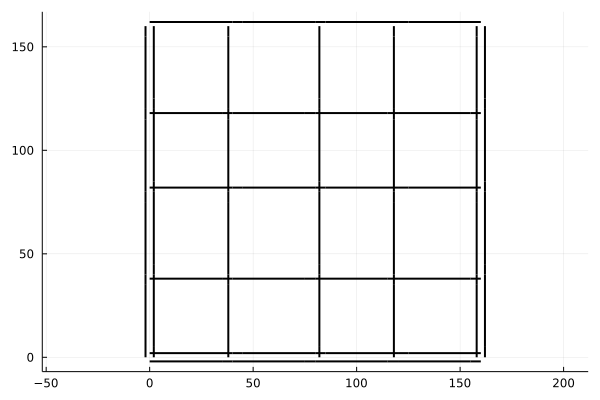

In [34]:
fig

In [35]:
capacidad_total = 0.
for edge in edges(SqNet)
    u = src(edge)
    v = dst(edge)
    capacidad_total += city_mt[u,v,2]
end
capacidad_total

416.0

In [36]:
autos = generate_autos(m,tamano_red,red_cuadrada,n_cars,ti,tf,h_distribution);

In [37]:
times, vels, ocupacion = simulacion!(0.,red_cuadrada, autos);

Red atascada
con 297.0 autos en ruta


In [38]:
fig, cols = plot_digraph(SqNet,posarr, attribute_matrix=vels,separated_edges=true,
c1 = colorant"red", c2 = colorant"green",
min_value = 0., max_value = 15.0);

In [39]:
cols

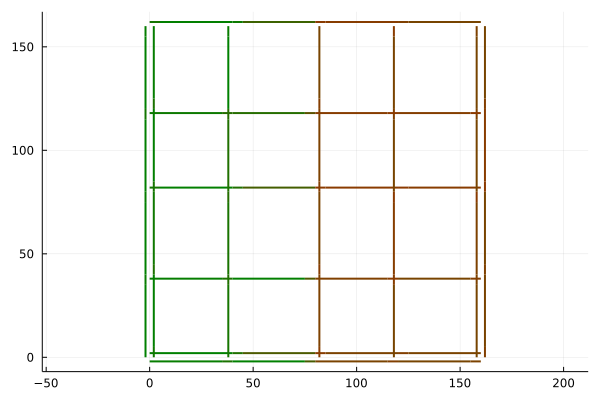

In [40]:
fig

In [41]:
saturaciones = [ocup./city_mt[:,:,2] for ocup in ocupacion];

In [42]:
fig, cols = plot_digraph(SqNet,posarr, attribute_matrix=last(saturaciones),separated_edges=true,
c1 = colorant"green", c2 = colorant"red",
min_value = 0., max_value = 1.0);

In [43]:
cols

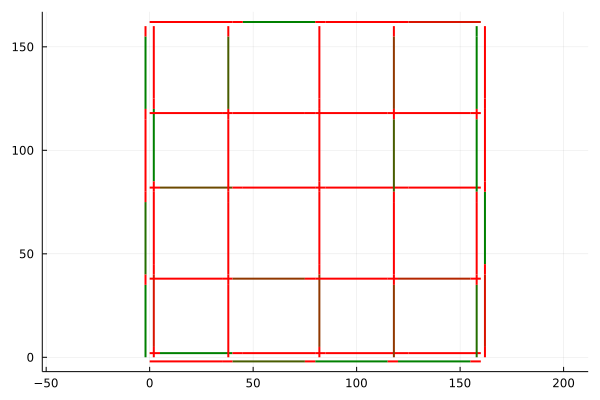

In [44]:
fig

In [45]:
cropped_times = round.(times, digits=1);

In [46]:
last(cropped_times)*2

297.2

In [47]:
indexes = []
for i in 1:300
    if length(findall(x -> x == i*0.5, cropped_times)) > 0
        index = findall(x -> x == i*0.5, cropped_times)[1]
        push!(indexes, index)
    end
end

In [48]:
reduced_times = [cropped_times[x] for x in indexes];
reduced_saturaciones = [saturaciones[x] for x in indexes];

In [49]:
length(reduced_times)

253

┌ Info: Saved animation to 
│   fn = /Users/Mariana/Documents/Code-MarianaTesis/code/julia-code/Mariana-Notebooks/test-nodiag.gif
└ @ Plots /Users/Mariana/.julia/packages/Plots/AJMX6/src/animation.jl:114


Plots.AnimatedGif("/Users/Mariana/Documents/Code-MarianaTesis/code/julia-code/Mariana-Notebooks/test-nodiag.gif")
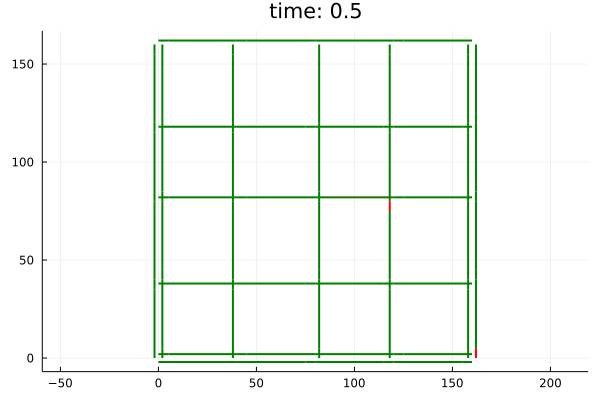

In [50]:
anim = @animate for i in 1:length(reduced_times)
    fig, cols = plot_digraph(SqNet, posarr,attribute_matrix=reduced_saturaciones[i],
    separated_edges=true,
    c1 = colorant"green", c2 = colorant"red",
    min_value = 0., max_value = 1.0)
    time = reduced_times[i]
    fig
    plot!(title="time: $time")
end
gif(anim, "test-nodiag.gif", fps = 5)

In [51]:
position_array = posarr;

In [52]:
new_times, x_out, y_out, x_dest, y_dest = continuos_time!(times,autos);

In [53]:
maximum(filter(!isnan,[position[2] for position in autos[400].posicion]))

125.0

In [54]:
c1 = colorant"red"
c2 = colorant"blue"
carcolors = range(c1, stop=c2, length=length(autos))

┌ Warning: Indices Base.OneTo(1500) of attribute `markercolor` does not match data indices 1:1.
└ @ Plots /Users/Mariana/.julia/packages/Plots/AJMX6/src/utils.jl:132
┌ Info: Data contains NaNs or missing values, and indices of `markercolor` vector do not match data indices.
│ If you intend elements of `markercolor` to apply to individual NaN-separated segements in the data,
│ pass each segment in a separate vector instead, and use a row vector for `markercolor`. Legend entries
│ may be suppressed by passing an empty label.
│ For example,
│     plot([1:2,1:3], [[4,5],[3,4,5]], label=["y" ""], markercolor=[1 2])
└ @ Plots /Users/Mariana/.julia/packages/Plots/AJMX6/src/utils.jl:134
┌ Warning: Indices Base.OneTo(1500) of attribute `markercolor` does not match data indices 1:1.
└ @ Plots /Users/Mariana/.julia/packages/Plots/AJMX6/src/utils.jl:132
┌ Info: Data contains NaNs or missing values, and indices of `markercolor` vector do not match data indices.
│ If you intend elements of `markerco

Plots.AnimatedGif("/Users/Mariana/Documents/Code-MarianaTesis/code/julia-code/Mariana-Notebooks/firstdaydiag-1sent.gif")
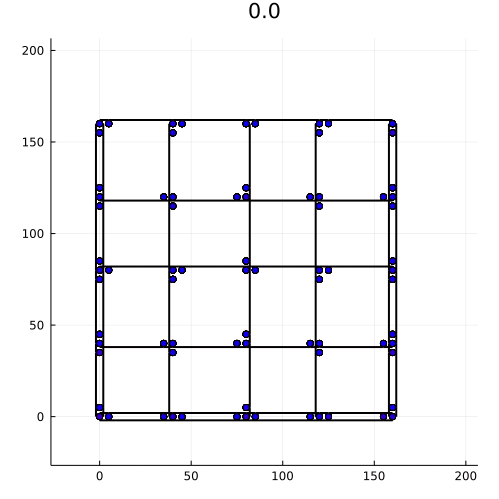

In [55]:
anim = @animate for i in 1:10:length(new_times)
    x = [element[i] for element in x_out]
    y = [element[i] for element in y_out]
    x2 = [element[i] for element in x_dest]
    y2 = [element[i] for element in y_dest]
    fig, cols = plot_digraph(SqNet,posarr, separated_edges=true);
    fig
    scatter!(x, y, xlim=[-20,200],ylim=[-20,200], labels=false, title = string(new_times[i]),
        mcolor = carcolors,aspect_ratio = 1, size=(500,500))
    scatter!(x2, y2, xlim=[-20,200],ylim=[-20,200], labels=false,
        mcolor = RGB(0,1,0),aspect_ratio = 1, size=(500,500))
end
gif(anim, "firstdaydiag-1sent.gif", fps = 50)